# Libraries

To create a decision tree model, we will use the following libraries:

In [1]:
#ignore FutureWarning
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from sklearn.tree import DecisionTreeClassifier
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
from graphviz import Source

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

import seaborn as sb
import matplotlib.pyplot as plt

#for graphviz
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz-10.0.1-win64/bin/'

C:\Users\josha\AppData\Local\Temp\ipykernel_44688\246460036.py:7: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# Importing test and train data

From the revised oversampling notebook, we will import the test and train data. the train data has been oversampled to balance the quantity of each emotion.

In [2]:
#importing train and test split
train_set = pd.read_csv('./outputs/train_set_ov2_no_mismatch.csv')
test_set = pd.read_csv('./outputs/test_set_ov2_no_mismatch.csv')

#Split into features and target; x = features, y = target
X_train = train_set.iloc[:, 1:]
y_train = train_set['label']

X_test = test_set.iloc[:, 1:]
y_test = test_set['label']

#combining test and train set for cross validation
x = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

# Decision Tree Model Testing

We will first test the model where max_depth = 10. 

In [3]:
#create a decision tree model
tree_clf = DecisionTreeClassifier(max_depth = 3, random_state=42, criterion ="entropy")


In [4]:
#decision tree training
tree_clf.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

In [5]:
#creates a visualization of the decision tree
feature_names = X_train.columns
labels = tree_clf.classes_
export_graphviz(
    tree_clf,
    out_file="FER_ov2.dot",
    feature_names = feature_names,
    class_names=labels,
    rounded = True,
    filled=True,
    special_characters=True
)

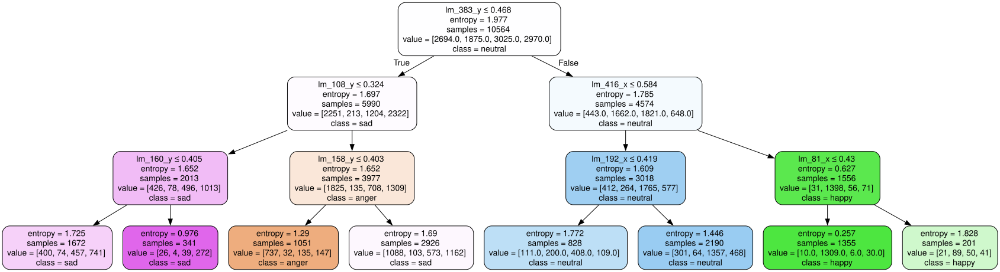

In [6]:
#displays the decision tree model visualization

graph = Source.from_file("FER_ov2.dot")
graph.render("FER_ov2")
graph

# Nature of Decision Tree

Due to the large amount of columns, the decision tree is very large and difficult to interpret once the maximum depth increases in size. However, since it is still a decision tree, it is still possible to interpret the tree and trace the path of the decision tree when a new data point is inputted.

# Testing the Model
We can observe the performance of the model using the confusion matrix and evaluation metrics.

In [7]:

cross_val_score(tree_clf,X_train,y_train, cv=5, scoring="accuracy")



array([0.47610033, 0.67770942, 0.47752011, 0.58353053, 0.56723485])

In [8]:
y_emotion_predict = cross_val_predict(tree_clf, X_train, y_train, cv=3)

In [9]:
cm = confusion_matrix(y_train,y_emotion_predict)
cm

array([[1316,   21,  403,  954],
       [  97, 1367,  222,  189],
       [ 684,   37, 1558,  746],
       [ 954,   66,  453, 1497]], dtype=int64)

In [10]:
#accuracy score
acs = accuracy_score(y_train,y_emotion_predict)

#precision score
#precision should be very high to avoid false positives
ps =precision_score(y_train,y_emotion_predict, average = "macro")
#recall score
rs = recall_score(y_train, y_emotion_predict, pos_label='e',average='macro')
#f1 score
fs =f1_score(y_train, y_emotion_predict, pos_label='e', average='macro')

print("Accuracy Score: ", acs)
print("Precision Score: ", ps)
print("Recall Score: ", rs)
print("F1 Score: ", fs)

Accuracy Score:  0.5431654676258992
Precision Score:  0.5953324896707377
Recall Score:  0.5591603350778487
F1 Score:  0.5729653298990889


In [11]:
#Test set
test_pred = tree_clf.predict(X_test)
cm = confusion_matrix(y_test,test_pred)
cm

array([[ 161,    5,   91,  350],
       [  21, 1072,  191,  142],
       [  18,   10,  140,  108],
       [  16,    8,   70,  237]], dtype=int64)

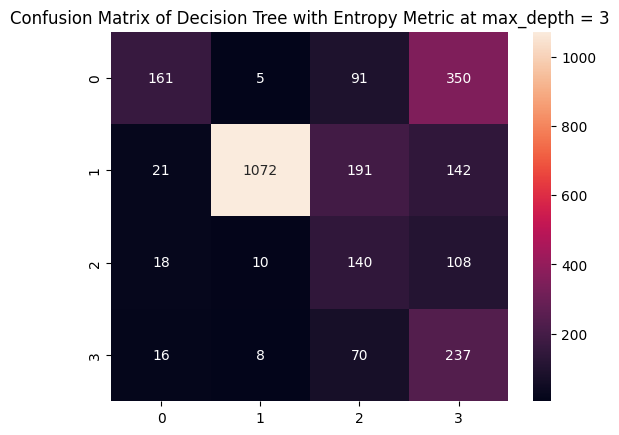

In [12]:
cmg = sb.heatmap(cm, annot=True, fmt='g')
plt.title("Confusion Matrix of Decision Tree with Entropy Metric at max_depth = 3")
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [13]:
acs_test = accuracy_score(y_test,test_pred)
ps_test = precision_score(y_test,test_pred, average = "macro")
rs_test = recall_score(y_test,test_pred,  average = "macro")
fs_test = f1_score(y_test,test_pred,  average = "macro")

print("Accuracy Score: ", acs_test)
print("Precision Score: ", ps_test)
print("Recall Score: ", rs_test)
print("F1 Score: ", fs_test)

Accuracy Score:  0.6098484848484849
Precision Score:  0.5730181928881448
Recall Score:  0.560062624205093
F1 Score:  0.5030282345405789


# Graphical Method for finding the best value of max_depth

In [14]:
max_depth = range(5, 26)
acc_test = []
acc_train = []
prec_test = []
prec_train = []
rec_test = []
rec_train = []
f1_test = []
f1_train = []

for i in max_depth:
    tree_clf = DecisionTreeClassifier(max_depth = i,random_state=42, criterion ="entropy")
    tree_clf.fit(X_train,y_train)
    y_emotion_predict = cross_val_predict(tree_clf, X_train, y_train, cv=3)
    #append to each list
    acc_train.append(accuracy_score(y_train,y_emotion_predict))
    prec_train.append(precision_score(y_train,y_emotion_predict, average = "macro"))
    rec_train.append(recall_score(y_train, y_emotion_predict,  average='macro'))
    f1_train.append(f1_score(y_train, y_emotion_predict,  average='macro'))
    test_pred = tree_clf.predict(X_test)
    f1_test.append(f1_score(y_test,test_pred, average = "macro"))
    acc_test.append(accuracy_score(y_test,test_pred))
    prec_test.append(precision_score(y_test,test_pred, average = "macro"))
    rec_test.append(recall_score(y_test,test_pred,  average='macro'))
    print('Done: ', i)

Done:  5
Done:  6
Done:  7
Done:  8
Done:  9
Done:  10
Done:  11
Done:  12
Done:  13
Done:  14
Done:  15
Done:  16
Done:  17
Done:  18
Done:  19
Done:  20
Done:  21
Done:  22
Done:  23
Done:  24
Done:  25


# Comparison of Decision Tree Models

The graphs below show the performance of the decision tree models with different max_depth values.

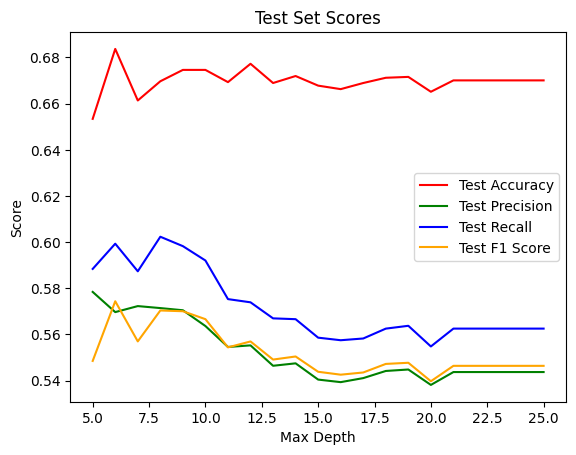

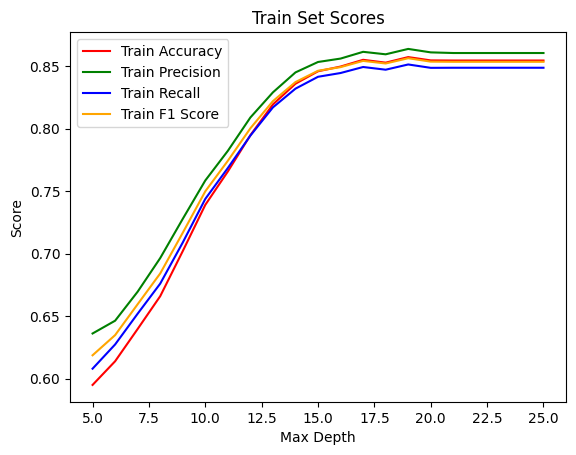

In [15]:
#plotting the accuracy, precision, recall and f1 score of test set

plt.plot(max_depth, acc_test, label = 'Test Accuracy', color = 'red')
plt.plot(max_depth, prec_test, label = 'Test Precision', color = 'green')
plt.plot(max_depth, rec_test, label = 'Test Recall', color = 'blue')
plt.plot(max_depth, f1_test, label = 'Test F1 Score', color = 'orange') 

plt.xlabel('Max Depth')
plt.ylabel('Score')
plt.title('Test Set Scores')
plt.legend()
plt.savefig('test_scores_ov2.png', dpi=300, bbox_inches='tight')
plt.show()

#plotting the accuracy, precision, recall and f1 score of train set

plt.plot(max_depth, acc_train, label = 'Train Accuracy', color = 'red')
plt.plot(max_depth, prec_train, label = 'Train Precision', color = 'green')
plt.plot(max_depth, rec_train, label = 'Train Recall', color = 'blue')
plt.plot(max_depth, f1_train, label = 'Train F1 Score', color = 'orange')

plt.xlabel('Max Depth')
plt.ylabel('Score')
plt.title('Train Set Scores')
plt.legend()
plt.savefig('train_scores_ov2.png', dpi=300, bbox_inches='tight')
plt.show()

# Selecting the best model

The criteria best model is the one with the highest F1 score.

In [16]:
#get the depth of the tree with the highest F1 score using index

best_depth = max_depth[f1_test.index(max(f1_test))]
best_depth

6

# Rerunning the model with the best max_depth value

We will rerun the model with the best max_depth value to observe the performance of the model.

In [17]:
#rerun the model with the best depth

tree_clf = DecisionTreeClassifier(max_depth = best_depth,random_state=42, criterion ="entropy")

tree_clf.fit(X_train,y_train)

test_pred = tree_clf.predict(X_test)



# Validation of the Model

In [18]:
# k-fold cross validation

cross_val_score(tree_clf,X_train,y_train, cv=5, scoring="accuracy")

array([0.52153336, 0.69853289, 0.52579271, 0.64505442, 0.62784091])

# Evaluation Metrics

In [19]:
# get the accuracy, precision, recall and f1 score of the best model

acs_test = accuracy_score(y_test,test_pred)
ps_test = precision_score(y_test,test_pred, average = "macro")
rs_test = recall_score(y_test,test_pred,  average = "macro")
fs_test = f1_score(y_test,test_pred,  average = "macro")

print("Accuracy Score: ", "{:.2%}".format(acs_test))
print("Precision Score: ", "{:.2%}".format(ps_test))
print("Recall Score: ", "{:.2%}".format(rs_test))
print("F1 Score: ", "{:.2%}".format(fs_test))

Accuracy Score:  68.37%
Precision Score:  56.97%
Recall Score:  59.93%
F1 Score:  57.44%


# Confusion matrix

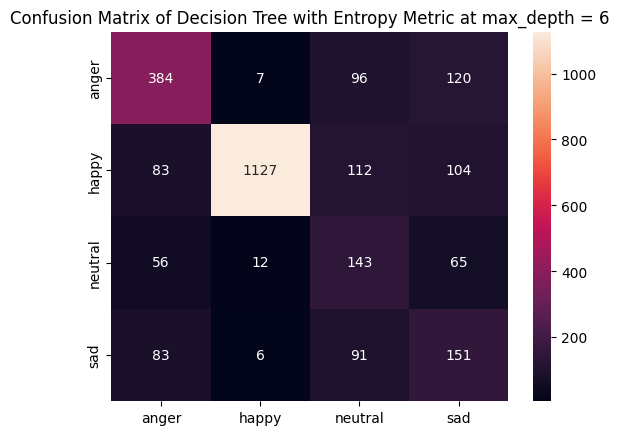

In [20]:
cm = confusion_matrix(y_test,test_pred)

cmg = sb.heatmap(cm, annot=True, fmt='g')

labels = tree_clf.classes_
cmg.set_xticklabels(labels)
cmg.set_yticklabels(labels)

plt.title("Confusion Matrix of Decision Tree with Entropy Metric at max_depth = " + str(best_depth))

plt.savefig('heatmap_best_depth_ov2.png', dpi=300, bbox_inches='tight')

# Decision Tree Model Visualization

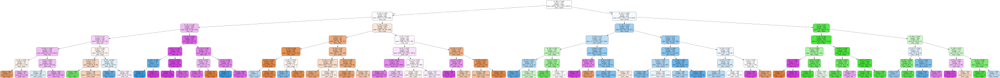

In [21]:
export_graphviz(
    tree_clf,
    out_file="FER_ov2.dot",
    feature_names = feature_names,
    class_names=labels,
    rounded = True,
    filled=True,
    special_characters=True
)

graph = Source.from_file("FER_ov2.dot")
graph.render("FER_best_depth_ov2")
graph

In [ ]:
#export the model

from joblib import dump

dump(tree_clf, './DTC_results/tree_best_depth_ov2_no_mismatch.joblib')

In [3]:
#load the model

from joblib import load

tree_clf = load('./DTC_results/tree_best_depth_ov2_no_mismatch.joblib')

In [15]:
#obtain the landmarks that were used in the model
import numpy as np

importances = tree_clf.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking according to each emotion
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f'Name: {X_train.columns[indices[f]]}, Index: {indices[f]}, Importance: {importances[indices[f]]}')
    
    
#store the features where importance is not 0
top_features = []
for f in range(X_train.shape[1]):
    if importances[indices[f]] != 0:
        top_features.append(X_train.columns[indices[f]])

#turn the top 20 landmarks into a list of integers

top = []

for i in top_features:
    top.append(int(i.split('_')[1]))
    
#remove duplicates in top
top = list(dict.fromkeys(top))
    
top
    

Feature ranking:
Name: lm_383_y, Index: 1147, Importance: 0.29178019397590693
Name: lm_416_x, Index: 1245, Importance: 0.2771313106511924
Name: lm_108_y, Index: 322, Importance: 0.034972196592082797
Name: lm_158_y, Index: 472, Importance: 0.030841200613231184
Name: lm_81_x, Index: 240, Importance: 0.02981188948497118
Name: lm_192_x, Index: 573, Importance: 0.025249214138393754
Name: lm_87_y, Index: 259, Importance: 0.021363608249495816
Name: lm_66_y, Index: 196, Importance: 0.01764788068337937
Name: lm_319_z, Index: 956, Importance: 0.014589568098873424
Name: lm_79_x, Index: 234, Importance: 0.014449365551855334
Name: lm_292_y, Index: 874, Importance: 0.013472479629579181
Name: lm_113_y, Index: 337, Importance: 0.01328239977392055
Name: lm_160_y, Index: 478, Importance: 0.012570919958501656
Name: lm_245_y, Index: 733, Importance: 0.009778749911238982
Name: lm_126_z, Index: 377, Importance: 0.009132478452385465
Name: lm_208_y, Index: 622, Importance: 0.008056918454274153
Name: lm_95_z, 

[383,
 416,
 108,
 158,
 81,
 192,
 87,
 66,
 319,
 79,
 292,
 113,
 160,
 245,
 126,
 208,
 95,
 189,
 443,
 328,
 433,
 29,
 339,
 65,
 64,
 55,
 129,
 137,
 386,
 5,
 233,
 78,
 195,
 35,
 197,
 298,
 93,
 12,
 27,
 123,
 100,
 16,
 315,
 155,
 217,
 31,
 62,
 321,
 111,
 48,
 250,
 271,
 442,
 344,
 1]

In [16]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from drawing_utils import draw_landmarks
from drawing_utils import DrawingSpec
from mediapipe.framework.formats import landmark_pb2
import matplotlib.pyplot as plt
#import drawings

def draw_landmarks_on_image(rgb_image, detection_result, landmarks_list):
  face_landmarks_list = detection_result.face_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected faces to visualize.
  for idx in range(len(face_landmarks_list)):
    face_landmarks = face_landmarks_list[idx]

    # Draw the face landmarks.
    face_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    face_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in face_landmarks
    ])

    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_TESSELATION,
        landmark_drawing_spec = DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_tesselation_style())
    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_CONTOURS,
        landmark_drawing_spec=DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_contours_style())
    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
          connection_drawing_spec=mp.solutions.drawing_styles
          .get_default_face_mesh_iris_connections_style())

  return annotated_image

def plot_face_blendshapes_bar_graph(face_blendshapes):
  # Extract the face blendshapes category names and scores.
  face_blendshapes_names = [face_blendshapes_category.category_name for face_blendshapes_category in face_blendshapes]
  face_blendshapes_scores = [face_blendshapes_category.score for face_blendshapes_category in face_blendshapes]
  # The blendshapes are ordered in decreasing score value.
  face_blendshapes_ranks = range(len(face_blendshapes_names))

  fig, ax = plt.subplots(figsize=(12, 12))
  bar = ax.barh(face_blendshapes_ranks, face_blendshapes_scores, label=[str(x) for x in face_blendshapes_ranks])
  ax.set_yticks(face_blendshapes_ranks, face_blendshapes_names)
  ax.invert_yaxis()

  # Label each bar with values
  for score, patch in zip(face_blendshapes_scores, bar.patches):
    plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{score:.4f}", va="top")

  ax.set_xlabel('Score')
  ax.set_title("Face Blendshapes")
  plt.tight_layout()
  plt.show()

Important Landmark found!:  1
Important Landmark found!:  5
Important Landmark found!:  12
Important Landmark found!:  16
Important Landmark found!:  27
Important Landmark found!:  29
Important Landmark found!:  31
Important Landmark found!:  35
Important Landmark found!:  48
Important Landmark found!:  55
Important Landmark found!:  62
Important Landmark found!:  64
Important Landmark found!:  65
Important Landmark found!:  66
Important Landmark found!:  78
Important Landmark found!:  79
Important Landmark found!:  81
Important Landmark found!:  87
Important Landmark found!:  93
Important Landmark found!:  95
Important Landmark found!:  100
Important Landmark found!:  108
Important Landmark found!:  111
Important Landmark found!:  113
Important Landmark found!:  123
Important Landmark found!:  126
Important Landmark found!:  129
Important Landmark found!:  137
Important Landmark found!:  155
Important Landmark found!:  158
Important Landmark found!:  160
Important Landmark found!:  18

(-0.5, 4683.5, 3999.5, -0.5)

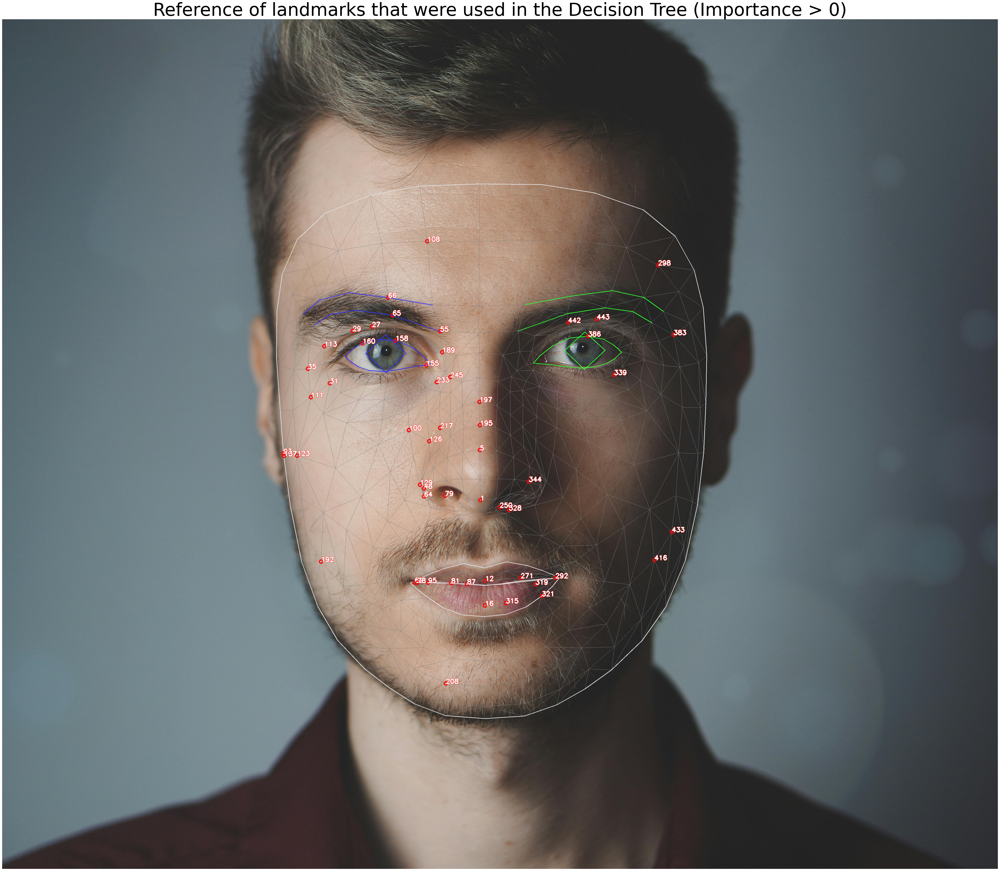

In [17]:
#Model Setup
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

base_options = python.BaseOptions(model_asset_path='face_landmarker_v2_with_blendshapes.task')
options = vision.FaceLandmarkerOptions(base_options=base_options,
                                       output_face_blendshapes=True,
                                       output_facial_transformation_matrixes=True,
                                       num_faces=1)

#Test the model
detector2 = vision.FaceLandmarker.create_from_options(options)               
image = mp.Image.create_from_file("../test.jpg")
detection_result = detector2.detect(image) #this is the line

annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result, top)
print(detection_result)

#annotated image
plt.figure(figsize=(60, 60))
plt.imshow(annotated_image)
plt.title(f'Reference of landmarks that were used in the Decision Tree (Importance > 0)', fontsize=60)
#title size

plt.axis('off')

In [14]:
#display the x, y, and z coordinates of the landmarks inside top_features

face_landmarks = detection_result.face_landmarks[0]
landmark_list = landmark_pb2.NormalizedLandmarkList()
landmark_list.landmark.extend([
    landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in face_landmarks
])

for i in top:
    print(f'#{top.index(i) + 1}\tLandmark: {i}\tx: {landmark_list.landmark[i].x}\ty: {landmark_list.landmark[i].y}\tz: {landmark_list.landmark[i].z}')
    

#1	Landmark: 383	x: 0.674413800239563	y: 0.3714005947113037	z: 0.029419034719467163
#2	Landmark: 416	x: 0.6551026105880737	y: 0.6362518668174744	z: 0.07350651919841766
#3	Landmark: 108	x: 0.4267786145210266	y: 0.2614763379096985	z: -0.06795784831047058
#4	Landmark: 158	x: 0.39504265785217285	y: 0.37807121872901917	z: -0.010298025794327259
#5	Landmark: 81	x: 0.4510535001754761	y: 0.6635233163833618	z: -0.007213920820504427
#6	Landmark: 192	x: 0.3203943967819214	y: 0.638272225856781	z: 0.08567080646753311
#7	Landmark: 87	x: 0.4670224189758301	y: 0.664592981338501	z: -0.010835432447493076
#8	Landmark: 66	x: 0.38763123750686646	y: 0.3275815546512604	z: -0.059366025030612946
#9	Landmark: 319	x: 0.5355817079544067	y: 0.6651456952095032	z: -0.0008710299734957516
#10	Landmark: 79	x: 0.4448927044868469	y: 0.5608634948730469	z: -0.069120392203331
#11	Landmark: 292	x: 0.5555419325828552	y: 0.6576573252677917	z: 0.017243187874555588
#12	Landmark: 113	x: 0.3236148953437805	y: 0.3847970962524414	z: 